In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import sklearn as sl
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error
from math import sqrt
import xgboost as xgb
from sklearn.linear_model import LinearRegression
import seaborn as sns

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/mredshaw/Flight_Price_Forecasting_Business_Proposal/main/data/Adjusted_Flight_Price_Time_Series.csv')

In [3]:
df.head()

,Unnamed: 0,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price,flight_id
0,120065,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,1,7368.48,1
1,120065,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,2,7332.36,1
2,120065,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,3,7296.24,1
3,120065,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,4,7260.12,1
4,120065,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,5,7224.00,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        150000 non-null  int64  
 1   airline           150000 non-null  object 
 2   flight            150000 non-null  object 
 3   source_city       150000 non-null  object 
 4   departure_time    150000 non-null  object 
 5   stops             150000 non-null  object 
 6   arrival_time      150000 non-null  object 
 7   destination_city  150000 non-null  object 
 8   class             150000 non-null  object 
 9   duration          150000 non-null  float64
 10  days_left         150000 non-null  int64  
 11  price             150000 non-null  float64
 12  flight_id         150000 non-null  int64  
dtypes: float64(2), int64(3), object(8)
memory usage: 14.9+ MB


In [34]:
df.describe()

,Unnamed: 0,duration,days_left,price,flight_id
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,149874.466800,12.315088,19.641800,22236.906386,2500.500000
std,86679.966221,7.127591,10.580808,24197.955371,1443.380455
min,106.000000,0.830000,1.000000,1105.000000,1.000000
25%,75096.250000,7.000000,11.000000,5094.182500,1250.750000
50%,149269.500000,11.420000,20.000000,7806.037500,2500.500000
75%,226017.500000,16.170000,27.000000,46130.480000,3750.250000
max,300141.000000,40.420000,49.000000,113522.625000,5000.000000


In [35]:
df = df.drop(columns=['Unnamed: 0'])

In [36]:
df['train_test_mark'] = 'train'

In [37]:
avg_price_over_days = df.groupby('days_left')['price'].mean()


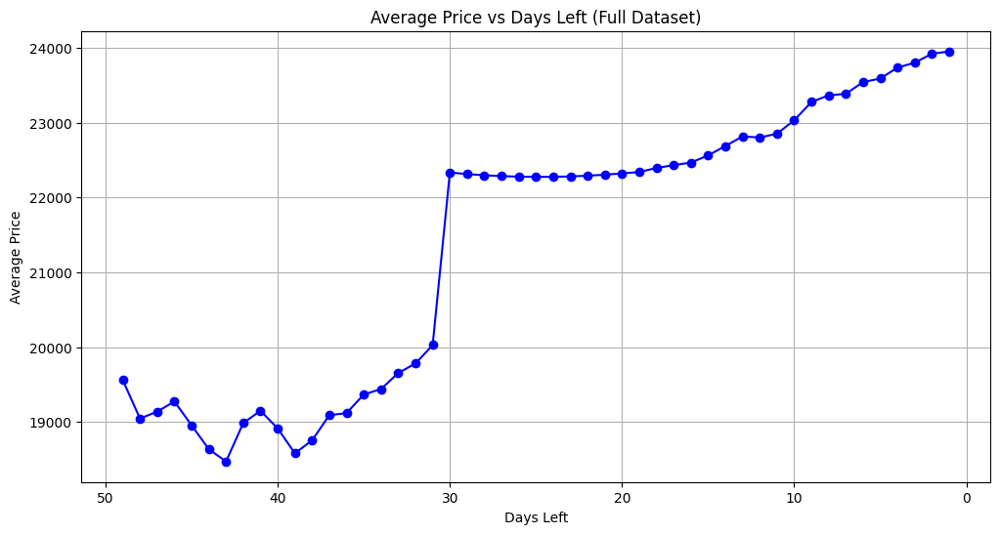

In [38]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
avg_price_over_days.plot(kind='line', color='blue', marker='o')
plt.title('Average Price vs Days Left (Full Dataset)')
plt.xlabel('Days Left')
plt.ylabel('Average Price')
plt.grid(True)
plt.gca().invert_xaxis()
plt.show()


In [39]:
sample_flight_id = df['flight_id'].sample(4000).iloc[0]
sample_flight_data = df[df['flight_id'] == sample_flight_id]


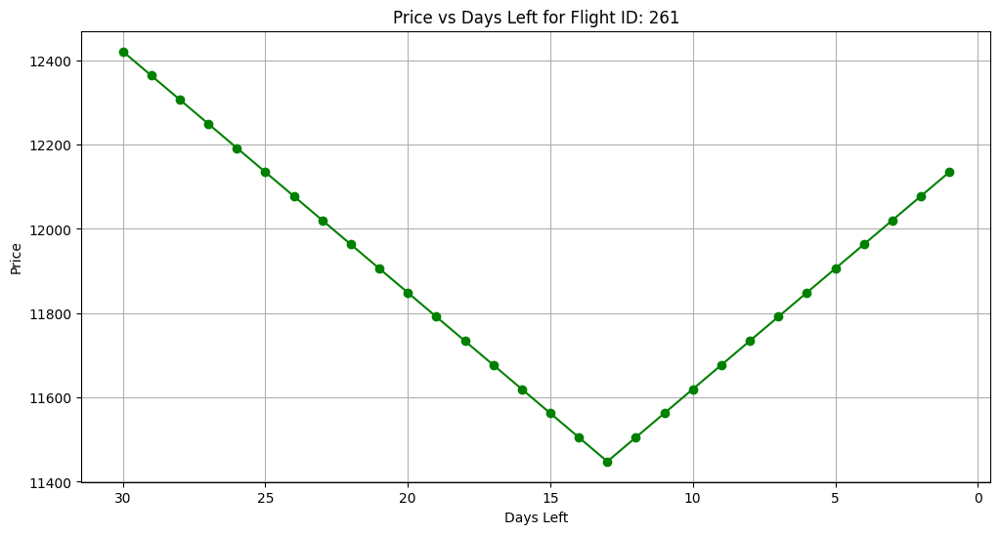

In [40]:
plt.figure(figsize=(12, 6))
plt.plot(sample_flight_data['days_left'], sample_flight_data['price'], marker='o', linestyle='-', color='green')
plt.title(f'Price vs Days Left for Flight ID: {sample_flight_id}')
plt.xlabel('Days Left')
plt.ylabel('Price')
plt.grid(True)
plt.gca().invert_xaxis()
plt.show()


To ensure our training and testing data is being split in accordance with the time-series forecast problem we're trying to answer, we need to be sure no flights price values from "future" days are included in training. We also need to be sure no "past" days flight prices are included in the test split. This would mimic the real world scenario where we have some past price information and are trying to predict the price of the flight a few days into the future. 

We also want to include some flights full range of date information, which would be available for flights that have already occured in the past. To mimic this, we'll randomly assign a value to each flight, and if the value falls underneath a set threshold, the whole flight's data will be set to test. Otherwise, the remaining flights will have their 30 day range of data randomly split at a point between 8 and 30 days_left, with the higher days_left value being set to train, and the lower days_left values being set to test. This would mimic the real world scenario of only knowing past prices and not future prices, and also ensures randomness in the amount of data we have available for each flight.

In [41]:
for flight_id in df['flight_id'].unique():
    if np.random.rand() > 0.5:
        continue
    else:
        cutoff = np.random.randint(8, 31)  # Random cutoff of days_left between 8 and 30 to ensure at least the final 7 days of a flights prices are being sent into test to mimic 7 day future forecasts.
        df.loc[(df['flight_id'] == flight_id) & (df['days_left'] < cutoff), 'train_test_mark'] = 'test'


In [42]:
train_df = df[df['train_test_mark'] == 'train'].drop(columns=['train_test_mark'])
test_df = df[df['train_test_mark'] == 'test'].drop(columns=['train_test_mark'])

In [43]:
train_df['flight_id']

0            1
1            1
2            1
3            1
4            1
          ... 
149995    5000
149996    5000
149997    5000
149998    5000
149999    5000
Name: flight_id, Length: 115349, dtype: int64

In [44]:
X_train = train_df.drop(['price'], axis=1)
y_train = train_df['price']

X_test = test_df.drop(['price'], axis=1)
y_test = test_df['price']

Preprocessing building model and Pipeline 

In [45]:
df.head()

,airline,flight,source_city,departure_time,stops,arrival_time,destination_city,class,duration,days_left,price,flight_id,train_test_mark
0,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,1,7368.48,1,train
1,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,2,7332.36,1,train
2,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,3,7296.24,1,train
3,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,4,7260.12,1,train
4,Vistara,UK-738,Kolkata,Evening,zero,Night,Delhi,Economy,2.42,5,7224.00,1,train


In [46]:
numeric_features = ['duration', 'days_left', 'duration']
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_features = ['airline', 'flight', 'source_city', 'departure_time', 'stops', 'arrival_time', 'destination_city', 'class']
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])



In [47]:
rf_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=10, random_state=42, n_jobs=-1))
])

rf_pipeline.fit(X_train, y_train)
y_pred = rf_pipeline.predict(X_test)

Fit the model(pipeline) on the training data

In [48]:
mse = mean_squared_error(y_test, y_pred)
rmse = sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'RMSE: {rmse}')
print(f'Mean Absolute Error (MAE): {mae}')
print(f'R2 Score: {r2}')


Mean Squared Error: 9309543.403634742
RMSE: 3051.154437853768
Mean Absolute Error (MAE): 1581.9643666813013
R2 Score: 0.9836824995147504


In [49]:
print(mae)

1581.9643666813013


In [50]:
print(df['price'].mean())

22236.90638613334


In [51]:
mae/df['price'].mean()

0.0711413871701054

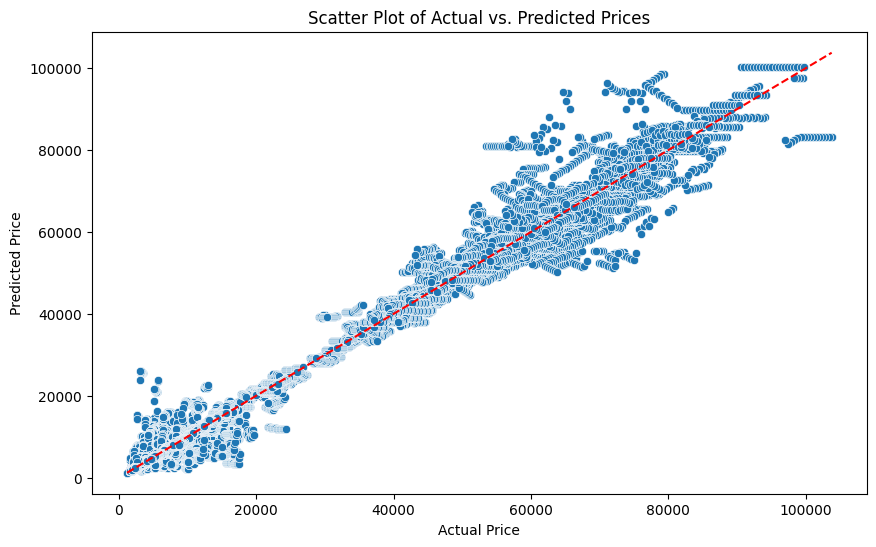

In [52]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Scatter Plot of Actual vs. Predicted Prices')
plt.show()

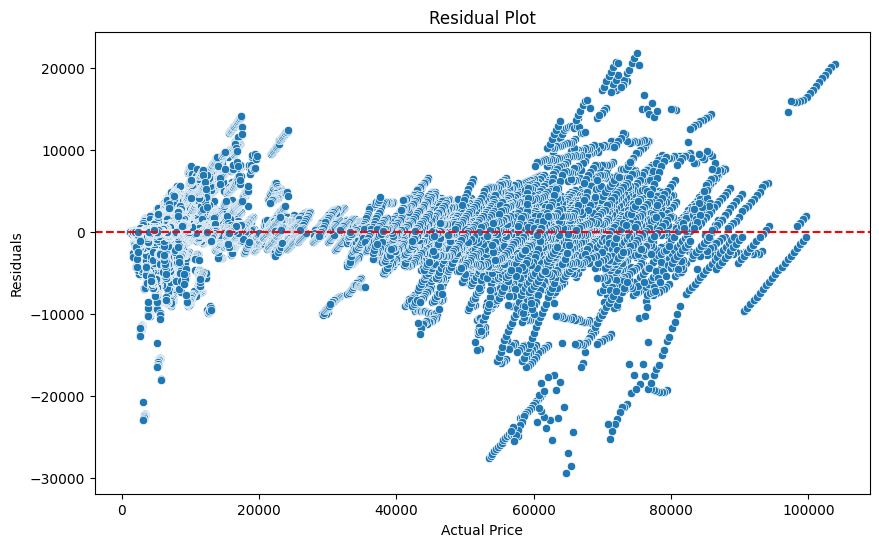

In [53]:
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Actual Price')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

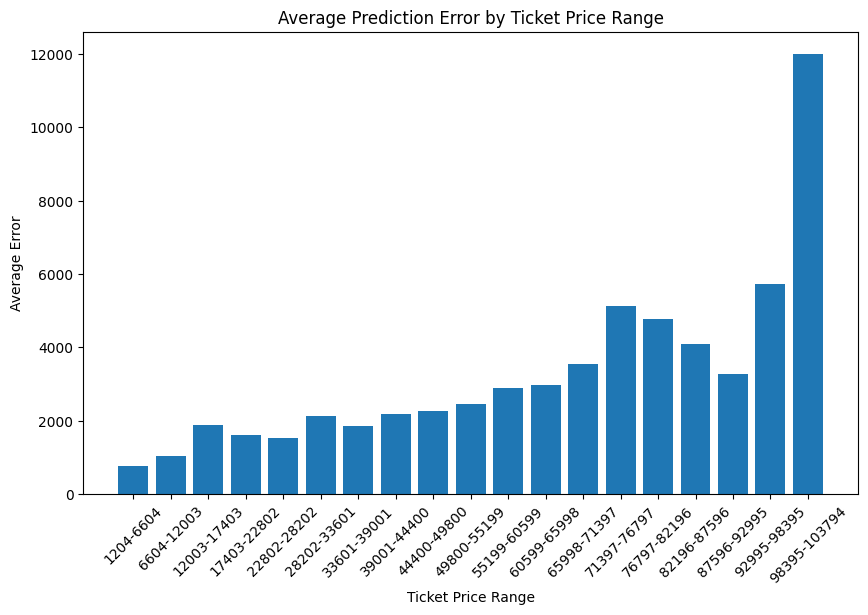

In [54]:
num_bins = 20

bins = np.linspace(y_test.min(), y_test.max(), num_bins)
bin_indices = np.digitize(y_test, bins)
bin_avg_error = [np.mean(abs(y_test[bin_indices == i] - y_pred[bin_indices == i])) for i in range(1, len(bins))]

plt.figure(figsize=(10, 6))
plt.bar(range(1, len(bins)), bin_avg_error, align='center')
plt.xticks(range(1, len(bins)), [(f'{bins[i]:.0f}-{bins[i+1]:.0f}') for i in range(num_bins-1)], rotation=45)
plt.xlabel('Ticket Price Range')
plt.ylabel('Average Error')
plt.title('Average Prediction Error by Ticket Price Range')
plt.show()


In [55]:
error_df = pd.DataFrame({'days_left': X_test['days_left'], 'error': residuals})


In [56]:
error_by_days = error_df.groupby('days_left')['error'].mean()


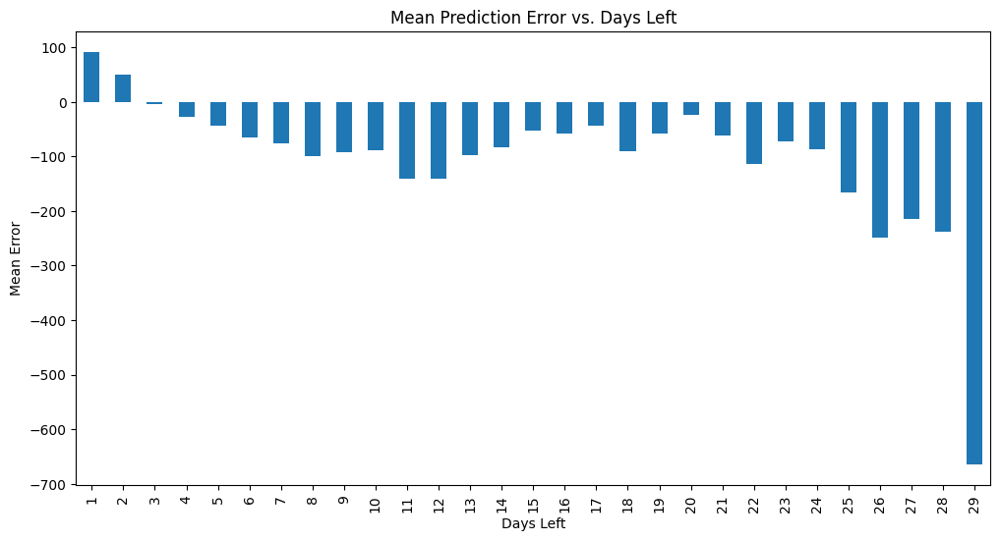

In [57]:
plt.figure(figsize=(12, 6))
error_by_days.plot(kind='bar')
plt.title('Mean Prediction Error vs. Days Left')
plt.xlabel('Days Left')
plt.ylabel('Mean Error')
plt.show()

**Model validation** 

For our model validation, we couldn't use a regular cross validation approach since this is a time-series problem, so random splitting wouldn't work. We have to ensure when the cross-validation splits are made, they are respecting the time sequence of the data, so we've built in our original splitting technique into each fold, to include some flights full range of price data, and other flights are given a random cutoff point in day's left and then split into training and testing, with lower days left always being used in testing. This ensures the validation is following the time-series of the problem.

In [58]:
rmse_scores = []
mae_scores = []

n_folds = 5

for fold in range(n_folds):
    train_fold = pd.DataFrame()
    validate_fold = pd.DataFrame()

    for flight_id in df['flight_id'].unique():
        flight_data = df[df['flight_id'] == flight_id]
#similar to how we split the data for the initial model, we'll do the same thing for each fold of the validation.
        if np.random.rand() > 0.5:
            # Use some flights full range of data for training
            train_fold = train_fold.append(flight_data)
        else:
            # Split remaining flights data based on a random days_left cutoff
            cutoff = np.random.randint(8, 31)
            train_fold = train_fold.append(flight_data[flight_data['days_left'] >= cutoff])
            validate_fold = validate_fold.append(flight_data[flight_data['days_left'] < cutoff])

    X_train_fold = train_fold.drop(['price'], axis=1)
    y_train_fold = train_fold['price']
    X_validate_fold = validate_fold.drop(['price'], axis=1)
    y_validate_fold = validate_fold['price']
    
    rf_pipeline.fit(X_train_fold, y_train_fold)
    predictions = rf_pipeline.predict(X_validate_fold)

    rmse_scores.append(np.sqrt(mean_squared_error(y_validate_fold, predictions)))
    mae_scores.append(mean_absolute_error(y_validate_fold, predictions))

average_rmse = np.mean(rmse_scores)
average_mae = np.mean(mae_scores)

print("Average RMSE across folds:", average_rmse)
print("Average MAE across folds:", average_mae)

/var/folders/4r/t2pxznrn4dz28d6ymprq1p9c0000gn/T/ipykernel_44724/291453232.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_fold = train_fold.append(flight_data)
/var/folders/4r/t2pxznrn4dz28d6ymprq1p9c0000gn/T/ipykernel_44724/291453232.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_fold = train_fold.append(flight_data[flight_data['days_left'] >= cutoff])
/var/folders/4r/t2pxznrn4dz28d6ymprq1p9c0000gn/T/ipykernel_44724/291453232.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  validate_fold = validate_fold.append(flight_data[flight_data['days_left'] < cutoff])
/var/folders/4r/t2pxznrn4dz28d6ymprq1p9c0000gn/T/ipykernel_44724/291453232.py:15: FutureWarning: The frame.append method is deprecated and w

Average RMSE across folds: 3208.0983192904046
Average MAE across folds: 1674.3107877270807
